In [1]:
import pandas as pd 
import numpy as np
import time 

import matplotlib.pyplot as plt                  # plots

import seaborn as sns                            # more plots

from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization

import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions

from tqdm import tqdm_notebook

%load_ext autoreload
%autoreload 2

%matplotlib inline

# Step 1: Time Series Analysis of Visits Macrostatistics with Gaussian Processes

First off, we investigate the structure of all visits by all members. For this, we import the login data as a csv file and plot the daily logins.

In [2]:
login_data_sanitized = pd.read_csv("login_data_sanitized.csv")

#Sets the login date as the index of login_data_sanitized. 
#Running twice will result in a KeyError exception
login_data_sanitized = login_data_sanitized.set_index("DATE_SAVED")

/Users/nicholasjunge/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (4,7) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


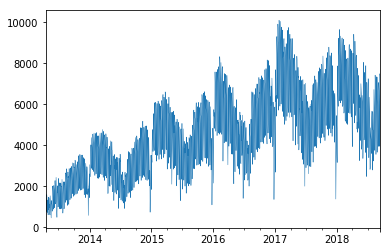

In [3]:
#We group all the logins 
member_logins = login_data_sanitized["RES_ID"]

#set DatetimeIndex to enable weekly / monthly mean grouping
member_logins.index = pd.DatetimeIndex(pd.to_datetime(member_logins.index))

member_logins = member_logins.astype(float)

#convert to float to prevent integer division problems
daily_logins = member_logins.groupby(member_logins.index.date).count().astype(float)

daily_logins.index = pd.DatetimeIndex(daily_logins.index)

daily_logins.plot(linewidth=0.5)

We see a time series with multiple features. First, there is a clearly visible upward trend throughout the years, meaning the business grows over time. Also, there is some seasonality, which is observed as a sine amplitude throughout the motion. 

As a second way of grouping, we take the weekly sums of all visits.

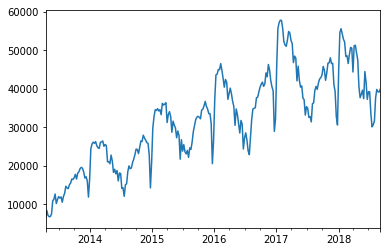

In [4]:
#sums up all logins during a week
weekly_logins = daily_logins.resample('W').sum()

adj_weekly_logins = weekly_logins.copy(deep=True)

#there is only data until 13.09.18, which gives us just half a week. We therefore drop the last week entry
adj_weekly_logins.drop(adj_weekly_logins.tail(1).index, inplace=True)

adj_weekly_logins.plot()

We now transform the raw count data to relative frequencies. To do this, we use the weekly login sums and divide all daily login data by the sums, effectively normalizing them. 

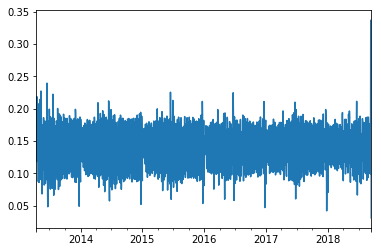

In [5]:
#create a deep independent copy
normalized_daily_logins = daily_logins.copy(deep=True)

for date, logins in normalized_daily_logins.items():
    endofweek = date + pd.DateOffset(6 - date.dayofweek)
    normalized_daily_logins[date] /= weekly_logins[endofweek]

normalized_daily_logins.plot()

We can see that the values seem to range around a mean value of about $0.15 \approx 1/7$, which leads us to believe that the weekday does not contribute a lot to the number of logins. For a seasonality structure as we see here, we can thus restrict ourselves to monthly deviations. 

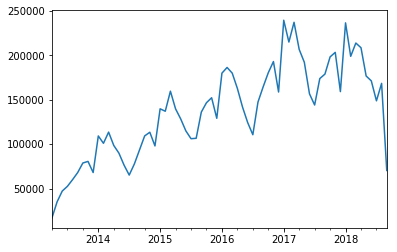

In [6]:
#sums up all logins during a week
monthly_logins = daily_logins.resample('M').sum()

monthly_logins.plot()

Now we make our first attempt at building a model to explain the weekly data. We will use an exponential smoothing approach, which is defined in the statsmodels package.

In [7]:
# Importing accuracy metrics
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

We first investigate the hypothesis that each value depends on $k$ previous values for some integer parameter $k$. This model is called the moving average.

In [8]:
def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])

moving_average(daily_logins, 24) # prediction for the last observed month (past 30 days)

5554.416666666667

For a series like we have for our daily logins, we cannot make predictions that far into the future. But taking the moving average can also be used to smooth out a time series and identify trends on different time scales. For short term trends, the moving average is taken with smaller k, while for long range trends, a larger k can be used.

In [11]:
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):
    """
        series - dataframe with timeseries
        window - rolling window size, corresponds to k
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 

    """
    rolling_mean = series.rolling(window=window).mean()

    my_dpi = 250
    plt.figure(figsize=(2560/my_dpi, 1600/my_dpi), dpi=my_dpi)
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, "r--", label="Upper Bound / Lower Bound")
        plt.plot(lower_bound, "r--", label="")
        
        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.Series(index=series.index)
            anomalies[series<lower_bound] = series[series<lower_bound]
            anomalies[series>upper_bound] = series[series>upper_bound]
            plt.plot(anomalies, "ro", markersize=10, label="Anomalies")
    
    plt.xlabel('Year')
    plt.ylabel('Number of logins')
    plt.plot(series[window:], label="Actual values", linewidth=0.5)
    plt.legend(loc="upper left")
    plt.grid(True)

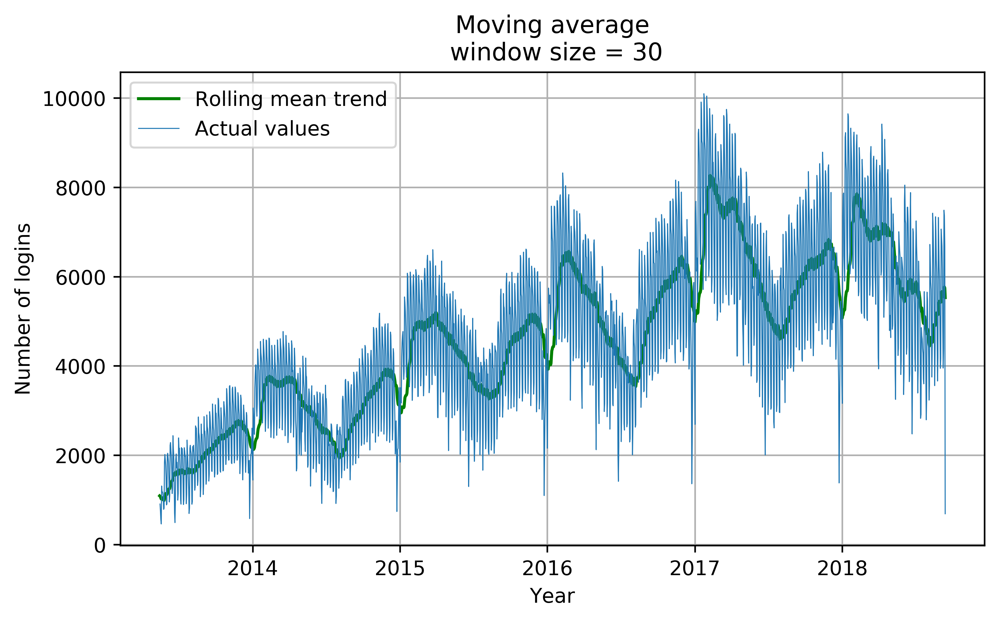

In [12]:
#monthly trend
plotMovingAverage(daily_logins, 30)

For a window size $k = 7$, we get the weekly trend:

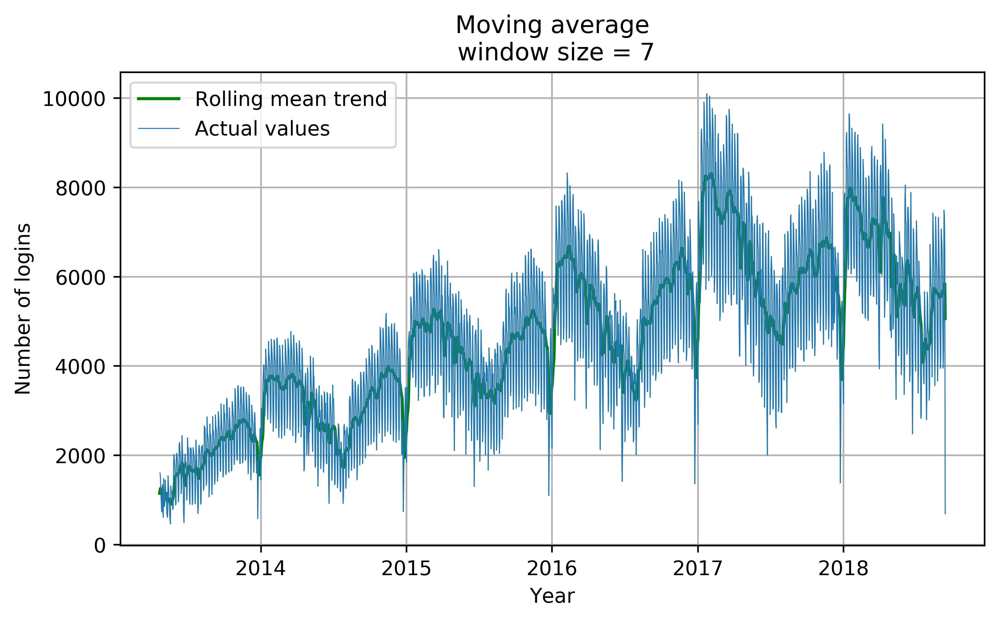

In [13]:
plotMovingAverage(daily_logins, window=7)

Lastly, we can also look at the annual trend.

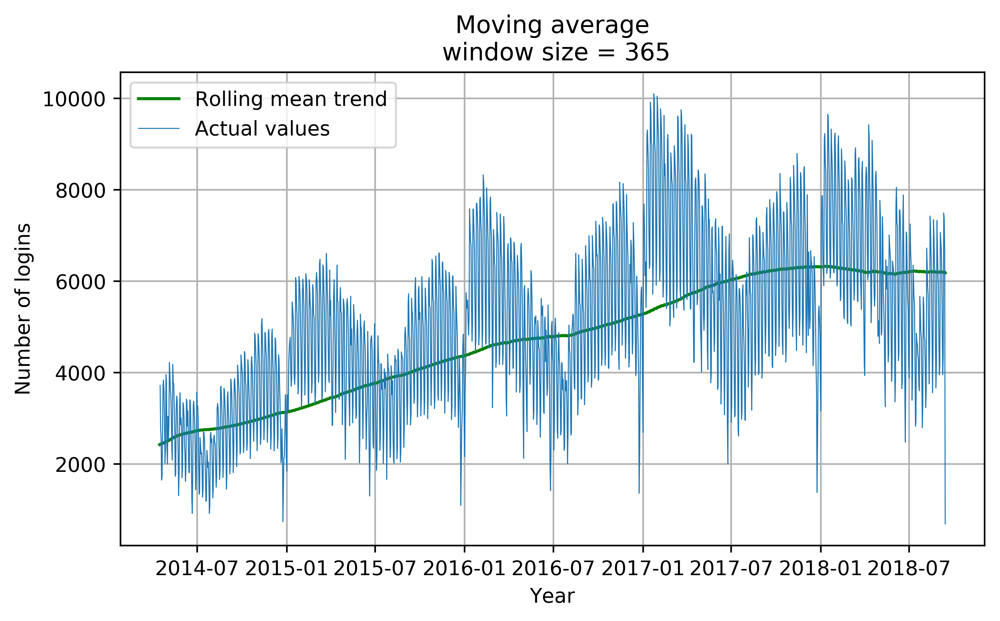

In [14]:
plotMovingAverage(daily_logins, window=365)

We identify a mostly linear trend, which starts levelling off at around January 2018.

We can also plot confidence intervals of our smoothed trends, indicating a significant deviation or anomaly.

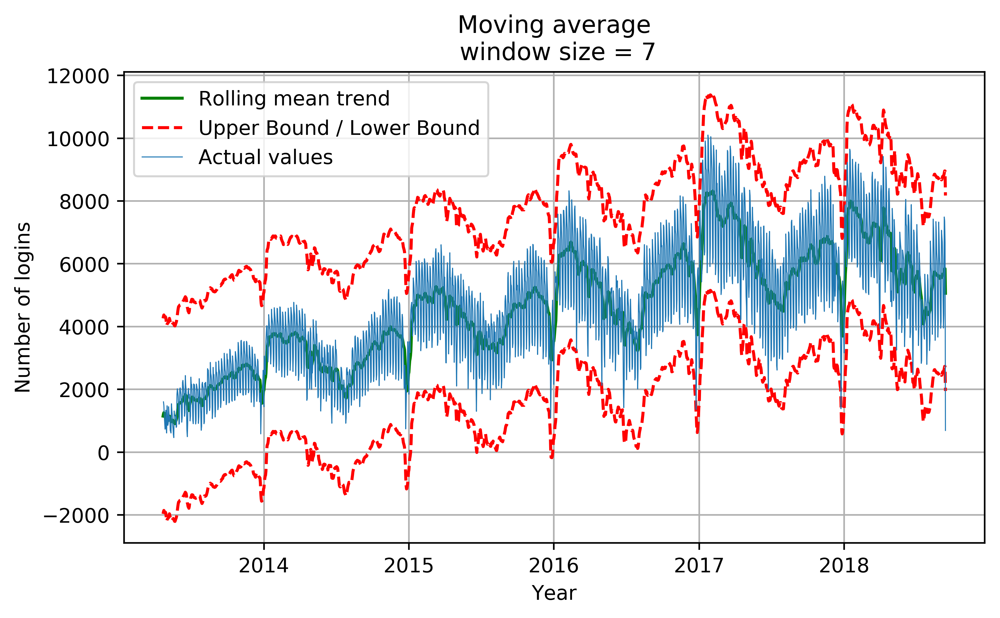

In [15]:
#weekly smoothing with confidence intervals
plotMovingAverage(daily_logins, window=7, plot_intervals=True)

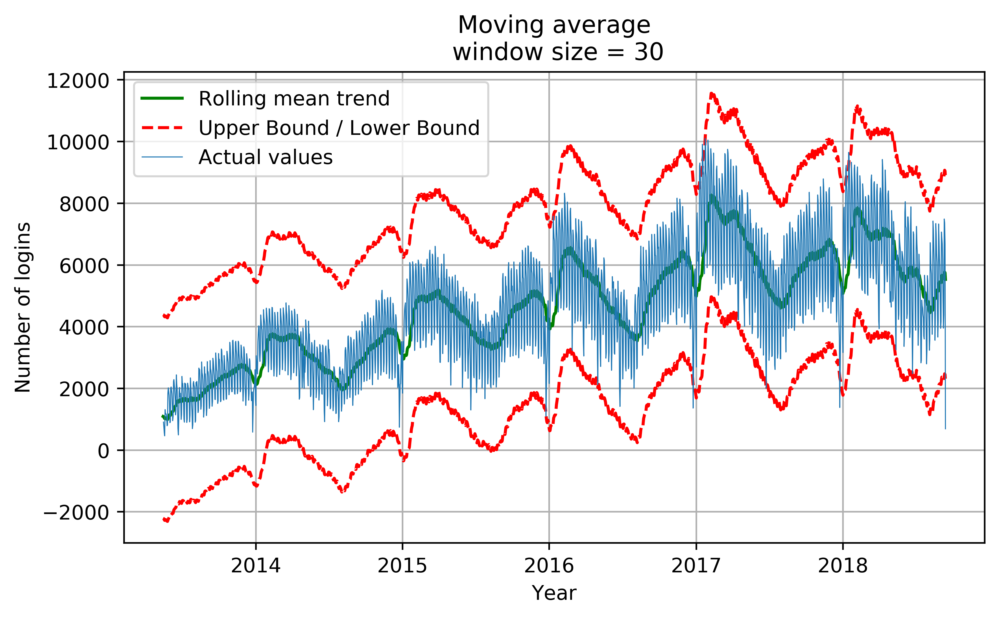

In [16]:
#monthly smoothing with confidence intervals
plotMovingAverage(daily_logins, 30, plot_intervals=True)

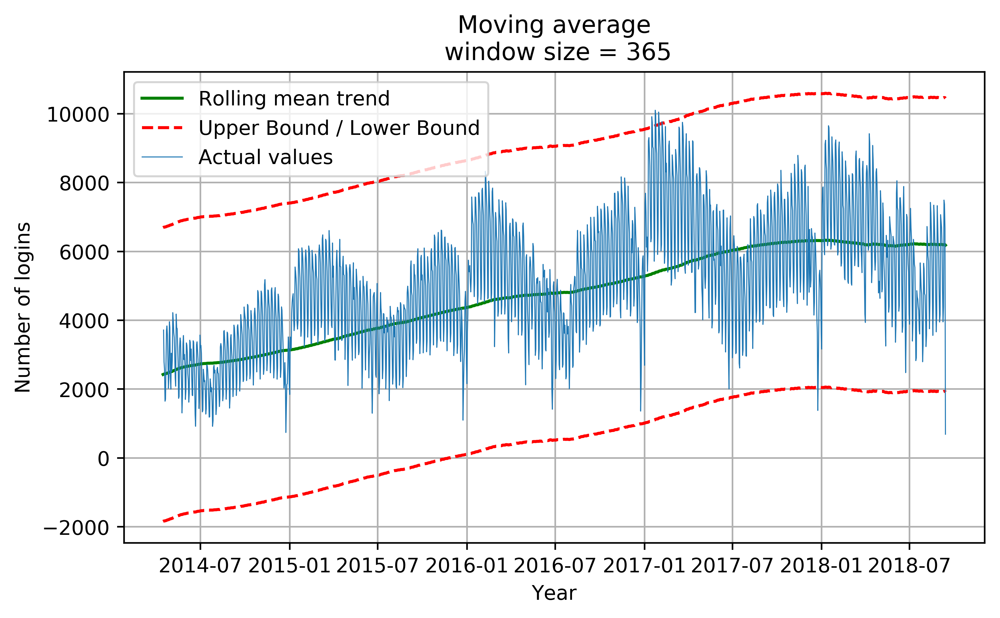

In [17]:
#annual smoothing with confidence intervals
plotMovingAverage(daily_logins, 365, plot_intervals=True)

Lastly, we can look at the number of anomalies we get for a given trend, i.e. the points that lie outside of a $1.96\sigma$ interval around the trend curve, where $\sigma$ denotes the standard deviation of the rolling mean trend.

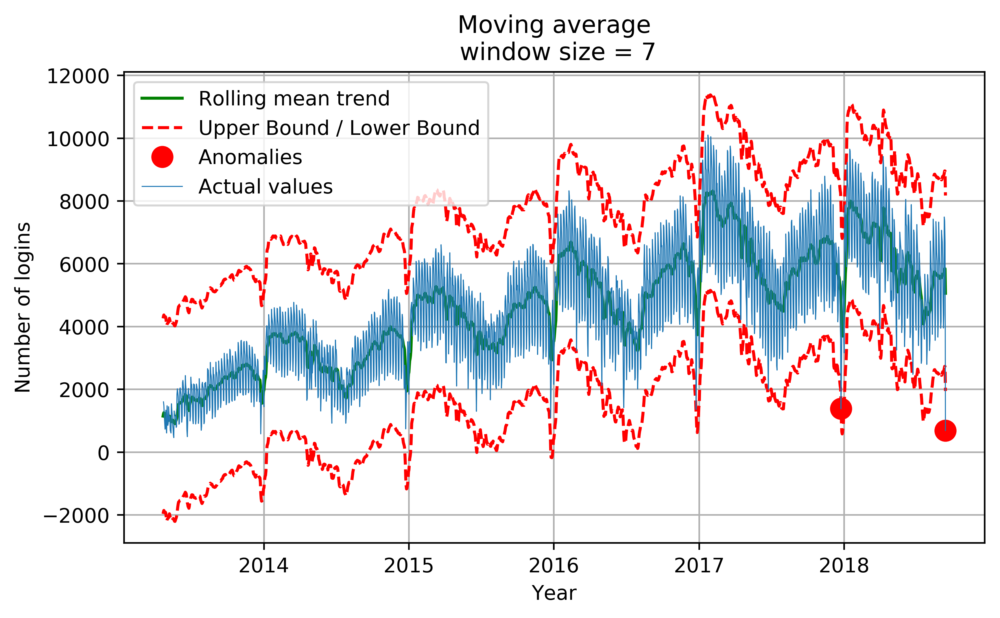

In [18]:
#weekly smoothing with confidence intervals and one-sigma outliers
plotMovingAverage(daily_logins, window=7, plot_intervals=True, plot_anomalies=True)

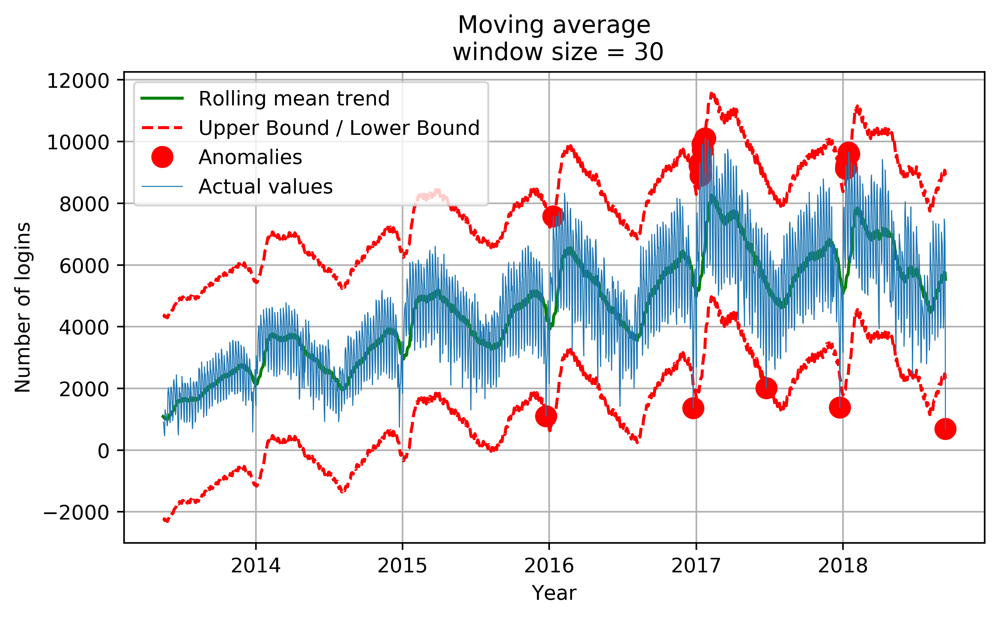

In [19]:
#monthly smoothing with confidence intervals and one-sigma outliers
plotMovingAverage(daily_logins, window=30, plot_intervals=True, plot_anomalies=True)

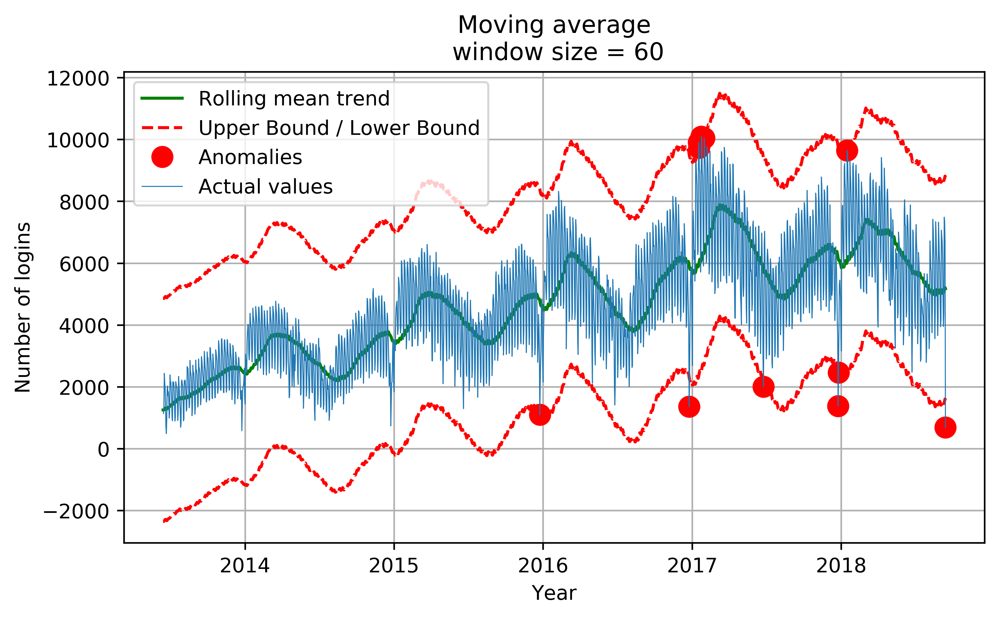

In [20]:
#bi-monthly smoothing with confidence intervals and one-sigma outliers
plotMovingAverage(daily_logins, window=60, plot_intervals=True, plot_anomalies=True)

Overall, we see that most of the data is well contained within the one-sigma confidence bounds. Just a few, overall persistent outliers show up in every possible smoothing approach, suggesting they are systematic errors or "freak values".


# Approach 2: Exponential Smoothing

Now, we assume a different model than just a linear moving average, which assumes a linear contribution of all past values within a window of size $k$ to the current value. Often, the effects of past values on the current value are observed to be rapidly decaying, suggesting that some sort of exponential function is in play. The model can be stated as 

\begin{equation}
\hat{y}_{t+1} = \alpha \cdot y_t + (1-\alpha) \cdot \hat{y}_{t-1},
\end{equation}

where $y_t$ is the current true value (which is typically known in maximum likelihood estimation) and $\hat{y}_t$ is the predicted value at some time $t$. For a time $t$, each previous value, contained implicitly in $\hat{y}_{t-1}$, is multiplied by the value $(1-\alpha)$. This means that __all__ previous values have a small, but nonzero influence on current model predictions.

In [21]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

In [22]:
def plotExponentialSmoothing(series, alphas):
    """
        Plots exponential smoothing with different alphas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters
        
    """
    with plt.style.context('seaborn-white'):    
        my_dpi = 500
        plt.figure(figsize=(3840/my_dpi, 2160/my_dpi), dpi=my_dpi)
        for alpha in alphas:
            plt.plot(exponential_smoothing(series, alpha), label="Alpha {}".format(alpha))
        plt.plot(series.values, "c", label = "Actual")
        plt.legend(loc="best")
        plt.axis('tight')
        plt.xlabel("Year")
        plt.ylabel("Number of logins")
        
        plt.title("Exponential Smoothing")
        plt.grid(True);

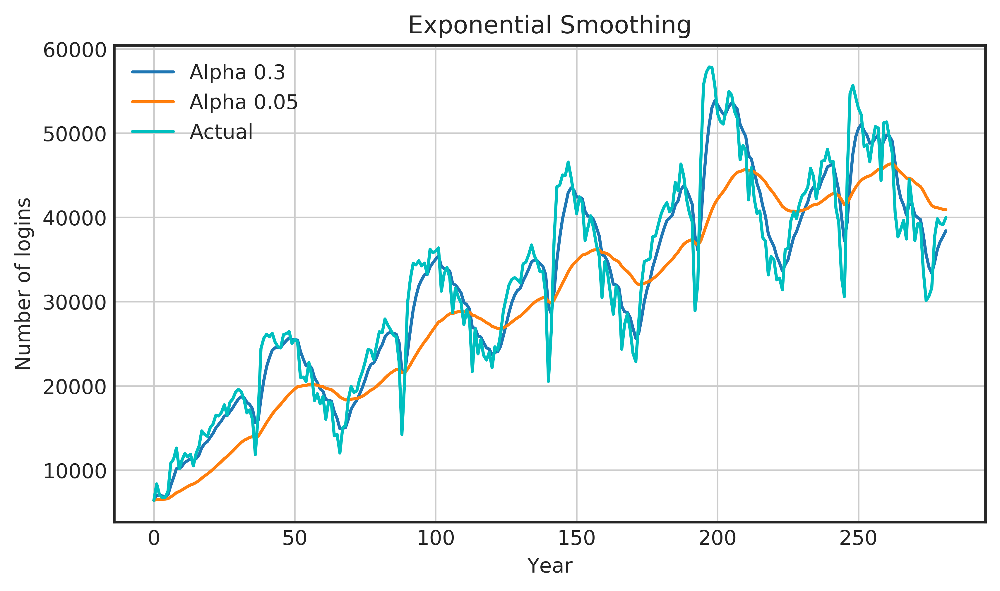

In [23]:
plotExponentialSmoothing(adj_weekly_logins, alphas=[0.3, 0.05])

# Approach 3: Double exponential smoothing

Exponential smoothing does not do well when there is a trend in the data. Therefore, the idea is to decompose a value into a sum of a slope $m$ plus an intercept $b$, both of which can depend on $t$, i.e. $y_t = m_t + b_t$ for all $t$. The slope is the new concept introduced here, acting as the best trend estimate at time $t$. The formulas are

\begin{align}
b_t &= \alpha y_t + (1-\alpha)(m_{t-1} + b_{t-1}) \\
m_t &= \beta(b_t - b_{t-1}) + (1-\beta)m_{t-1} \\
\hat{y}_{t+1} &= m_t + b_t
\end{align}

Explained in words, our slope $m_t$ is a convex combination (i.e. standard exponential smoothing) of the difference of the current and previous intercept estimates and the last slope. For the boundary points, the slope is taken to be the point itself.

The estimate of the intercept is then obtained by exponential smoothing of the current value and the linear extrapolation using the slope and intercept of the previous timestep.

In [25]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series): # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result

def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """
    
    with plt.style.context('seaborn-white'):    
        my_dpi = 500
        plt.figure(figsize=(3840/my_dpi, 2160/my_dpi), dpi=my_dpi)
        for alpha in alphas:
            for beta in betas:
                plt.plot(double_exponential_smoothing(series, alpha, beta), label="Alpha {}, beta {}".format(alpha, beta))
        plt.plot(series.values, label = "Actual")
        plt.legend(loc="best")
        plt.axis('tight')
        plt.xlabel("Year")
        plt.ylabel("Number of logins")
        plt.title("Double Exponential Smoothing")
        plt.grid(True)

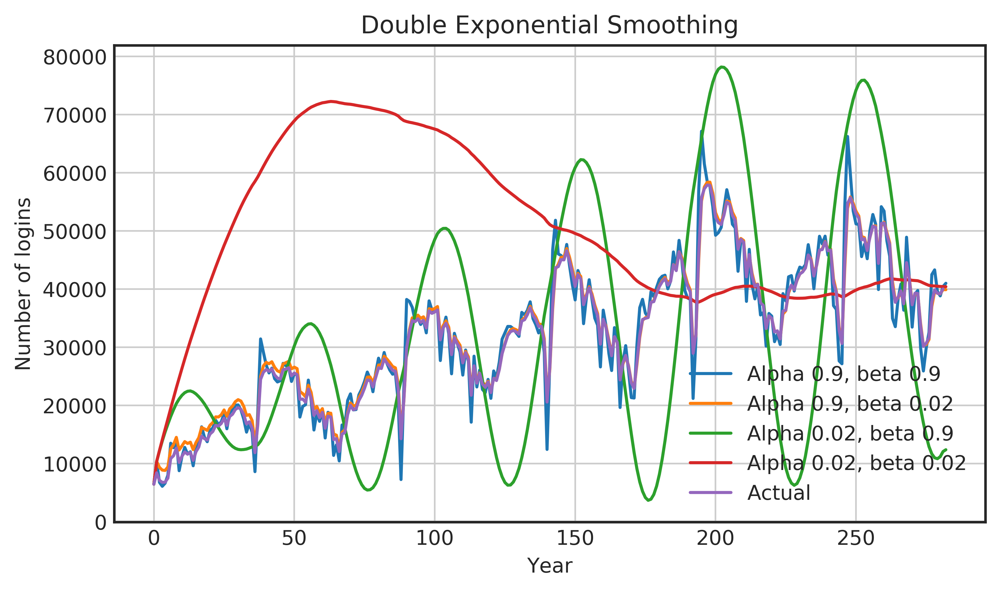

In [26]:
plotDoubleExponentialSmoothing(adj_weekly_logins, alphas=[0.9, 0.02], betas=[0.9, 0.02])

# Approach 4: Triple Exponential Smoothing (Holt-Winters method)

Like we added a trend component for double exponential smoothing, we can add a seasonality component to account for periodic effects in the data. The new system of equations looks like this:

\begin{align}
b_t &= \alpha(y_t - s_{t-L}) + (1-\alpha)(m_{t-1} + b_{t-1}) \\
m_t &= \beta(b_t - b_{t-1}) + (1-\beta)m_{t-1} \\
s_t &= \gamma(y_t - b_t) + (1-\gamma)s_{t-L} \\
\hat{y}_{t+k} &= b_t + km_t + s_{t-L+1+(k-1)modL} 
\end{align}

The intercept $b_t$ is now adjusted to the seasonal value with periodicity $L$. The trend remains unchanged, and the seasonality is a convex combination of the current value minus the intercept and the previous seasonal value $s_{t-L}$. Time-coherent components will only be averaged against each other, i.e. only values of the same suspected seasonality will be compared.

Additionally, the Brutlag method is used to produce confidence intervals on the predictions $\hat{y}_t$.

\begin{align}
\hat y_{max_t}&=m_{t−1}+b_{t−1}+s_{t−T}+k⋅d_{t−T} \\
\hat y_{min_t}&=m_{t−1}+b_{t−1}+s_{t−T}-k⋅d_{t−T} \\
d_t&=\gamma∣y_t−\hat y_t∣+(1−\gamma)d_{t−T},
\end{align}

where $T$ is the length of the season and $d_t$ is the predicted deviation at time $t$.

In [27]:
class HoltWinters:
    
    """
    Holt-Winters model with the anomalies detection using Brutlag method
    
    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)
    
    """
    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor
          
    def initial_trend(self):
        sum = 0.0 
        for i in range(len(self.series) % self.slen):
            sum += float(self.series[i+self.slen] - self.series[i]) / self.slen
        return sum / self.slen  
    
    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series)/self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(sum(self.series[self.slen*j:self.slen*j+self.slen])/float(self.slen))
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += self.series[self.slen*j+i]-season_averages[j]
            seasonals[i] = sum_of_vals_over_avg/n_seasons
        return seasonals   
 
    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBound = []
        self.LowerBound = []
        
        seasonals = self.initial_seasonal_components()
        
        #here we build an array of size length(original series) + number of predictions.
        #to not produce a size mismatch in the calculation of error metrics,
        #it is vital that number of predictions >= test_size, where test_size is the test set
        #that is removed before passing the series argument to this HoltWinters class.
        for i in range(len(self.series)+self.n_preds):
            if i == 0: # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i%self.slen])
                
                self.PredictedDeviation.append(0)
                
                self.UpperBound.append(self.result[0] + 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                
                self.LowerBound.append(self.result[0] - 
                                      self.scaling_factor * 
                                      self.PredictedDeviation[0])
                continue
                
            if i >= len(self.series): # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m*trend) + seasonals[i%self.slen])
                
                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1]*1.01) 
                
            else:
                val = self.series[i]
                last_smooth, smooth = smooth, self.alpha*(val-seasonals[i%self.slen]) + (1-self.alpha)*(smooth+trend)
                trend = self.beta * (smooth-last_smooth) + (1-self.beta)*trend
                seasonals[i%self.slen] = self.gamma*(val-smooth) + (1-self.gamma)*seasonals[i%self.slen]
                self.result.append(smooth+trend+seasonals[i%self.slen])
                
                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(self.gamma * np.abs(self.series[i] - self.result[i]) 
                                               + (1-self.gamma)*self.PredictedDeviation[-1])
                     
            self.UpperBound.append(self.result[-1] + 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.LowerBound.append(self.result[-1] - 
                                  self.scaling_factor * 
                                  self.PredictedDeviation[-1])

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i%self.slen])

To perform model selection in these parametric smoothing models, cross validation can be used just like in other statistical contexts. However, by the nature of time series data, which is ordered, cross validation can be performed sequentially in the following fashion:

First, we train the model on the data up to some point in time $t$. Then, we make predictions on some number $n$ of directly subsequent values. Then, we expand the training sample to size $t + n$, and validate on the next samples from $t + n$ until $t + 2*n$.

In [28]:
from sklearn.model_selection import TimeSeriesSplit # you have everything done for you

def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=52):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model, default: months
    """
    # errors array
    errors = []
    
    values = series.values
    alpha, beta, gamma = params
    
    # set the number of folds for cross-validation
    #n_splits should be chosen such that len(data) / n_splits >= slen
    #otherwise, model fails to pick up seasonality
    tscv = TimeSeriesSplit(n_splits=3) 
    
    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):

        model = HoltWinters(series=values[train], slen=slen, 
                            alpha=alpha, beta=beta, gamma=gamma, n_preds=len(test))
        model.triple_exponential_smoothing()
        
        predictions = model.result[-len(test):]
        actual = values[test]
        error = loss_function(predictions, actual)
        errors.append(error)
        
    return np.mean(np.array(errors))

For the smoothing coefficients $\alpha, \beta$ and $\gamma$, we add constraints for them ensuring that they are between zero and one. This means that we have to use a solver that supports parameter constraints, such as L-BFGS or Truncated Newton method.

In [29]:
#%%time
data = adj_weekly_logins[:-10] # leave some data for testing

slen = 52 #seasonality, 52 weeks = 1 year

# initializing model parameters alpha, beta and gamma
x = [0.1, 0.1, 0.1] 

# Minimizing the loss function 
opt = minimize(timeseriesCVscore, x0=x, 
               args=(data, mean_squared_log_error, slen), 
               method="TNC", bounds = ((0, 1), (0, 1), (0, 1))
              )

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...and train the model with them, forecasting for the next 36 weeks. 
#IMPORTANT: n_preds MUST BE GREATER OR EQUAL TEST_SIZE
model = HoltWinters(data, slen = slen, 
                    alpha = alpha_final, 
                    beta = beta_final, 
                    gamma = gamma_final, 
                    n_preds = 52, scaling_factor = 3)
model.triple_exponential_smoothing()

0.1087357822859234 0.140212996088952 0.3487494692329935


We write code to plot the results for Holt-Winters smoothing.

In [30]:
def plotHoltWinters(series, plot_intervals=False, plot_anomalies=False):
    """
        series - dataset with timeseries
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """
    my_dpi = 500
    plt.figure(figsize=(3840/my_dpi, 2160/my_dpi), dpi=my_dpi)
    plt.plot(model.result, label = "Model")
    plt.plot(series.values, label = "Actual")
    error = mean_absolute_percentage_error(series.values, model.result[:len(series)])
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    
    if plot_anomalies:
        anomalies = np.array([np.NaN]*len(series))
        anomalies[series.values<model.LowerBound[:len(series)]] = \
            series.values[series.values<model.LowerBound[:len(series)]]
        anomalies[series.values>model.UpperBound[:len(series)]] = \
            series.values[series.values>model.UpperBound[:len(series)]]
        plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    if plot_intervals:
        plt.plot(model.UpperBound, "r--", alpha=0.5, label = "Up/Low confidence")
        plt.plot(model.LowerBound, "r--", alpha=0.5)
        plt.fill_between(x=range(0,len(model.result)), y1=model.UpperBound, 
                         y2=model.LowerBound, alpha=0.2, color = "grey")    
        
    plt.vlines(len(series), ymin=min(model.LowerBound), ymax=max(model.UpperBound), linestyles='dashed')
    plt.axvspan(len(series)-20, len(model.result), alpha=0.3, color='lightgrey')
    plt.grid(True)
    plt.xlabel("Year")
    plt.ylabel("Number of logins")
    plt.axis('tight')
    plt.legend(loc="best", fontsize=13);

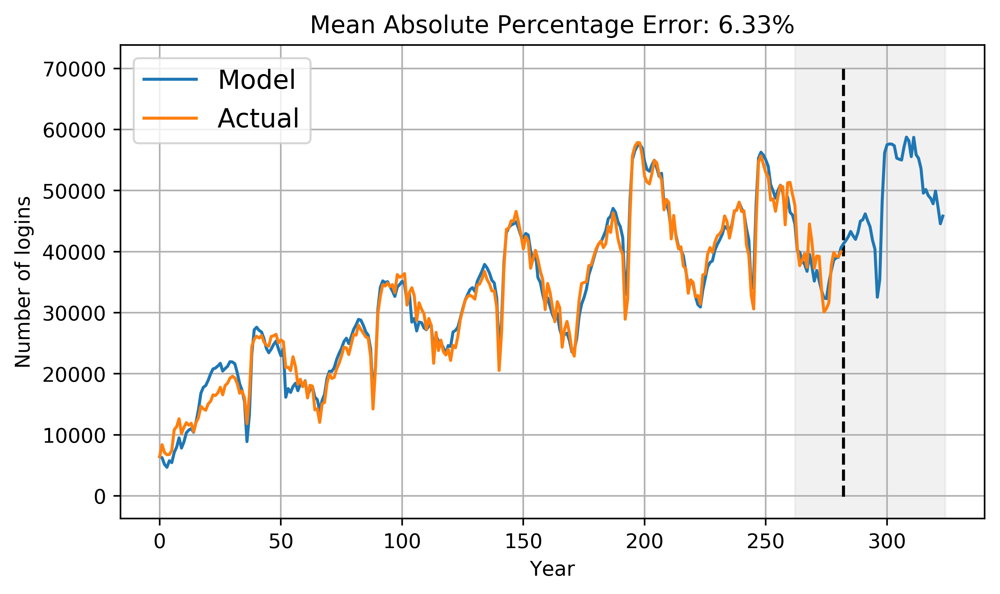

In [31]:
plotHoltWinters(adj_weekly_logins)

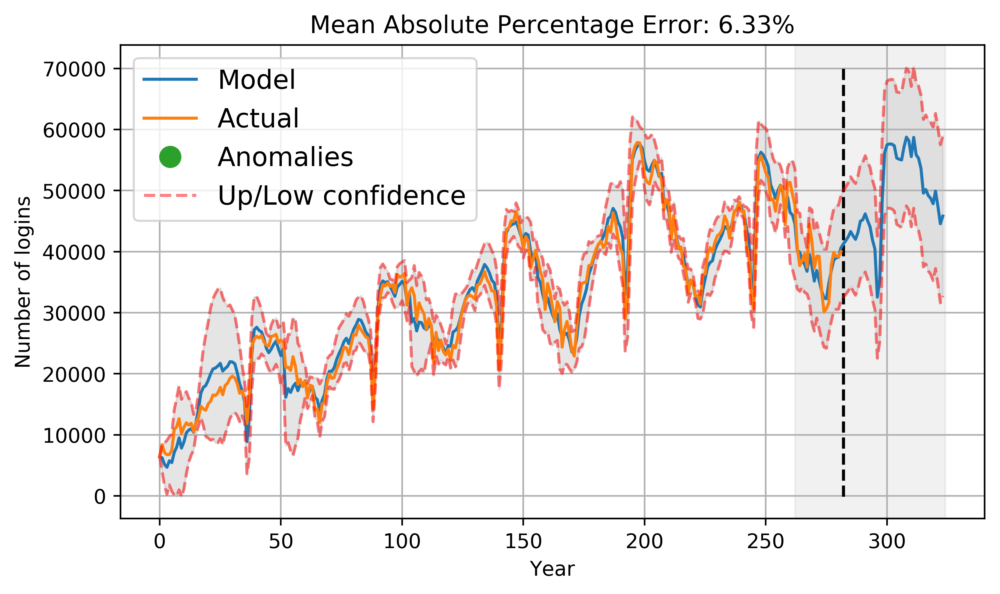

In [32]:
plotHoltWinters(adj_weekly_logins, plot_intervals=True, plot_anomalies=True)

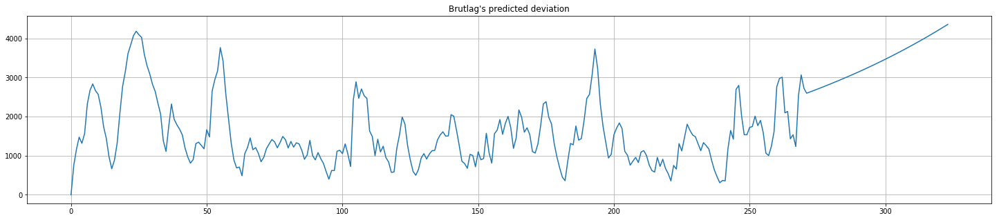

In [33]:
plt.figure(figsize=(25, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis('tight')
plt.title("Brutlag's predicted deviation");

We observe that the time series is close to our prediction and the confidence intervals generated by Brutlag's method are rather tight, but still the triple smoothing algorithm manages to predict the time series without producing a single outlier that is significant by Brutlag's method. This suggests that either the time series is very regular and the model thus becomes very accurate, or that our model is overfitting. 

# Approach 5: Econometric view using Stationary Stochastic Processes 

For a different approach, we will now concern ourselves with the theory of stochastic processes. There, a stochastic process with certain properties (noise levels, coefficients etc.) is assumed to emit the observed data. A central requirement to this type of model building is that the series is stationary, meaning that 

1. The mean is constant throughout the whole observed timeframe.
2. The variance is constant and finite throughout the whole timeframe.
3. The covariance between two points is assumed to be independent of the time, i.e. only dependent on the distance between the two timepoints. These distances are commonly called __lags.__

In [35]:
def tsplot(y, lags=None, dpi=500, style='bmh'):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        plt.figure(figsize=(3840/dpi, 2160/dpi), dpi=dpi)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

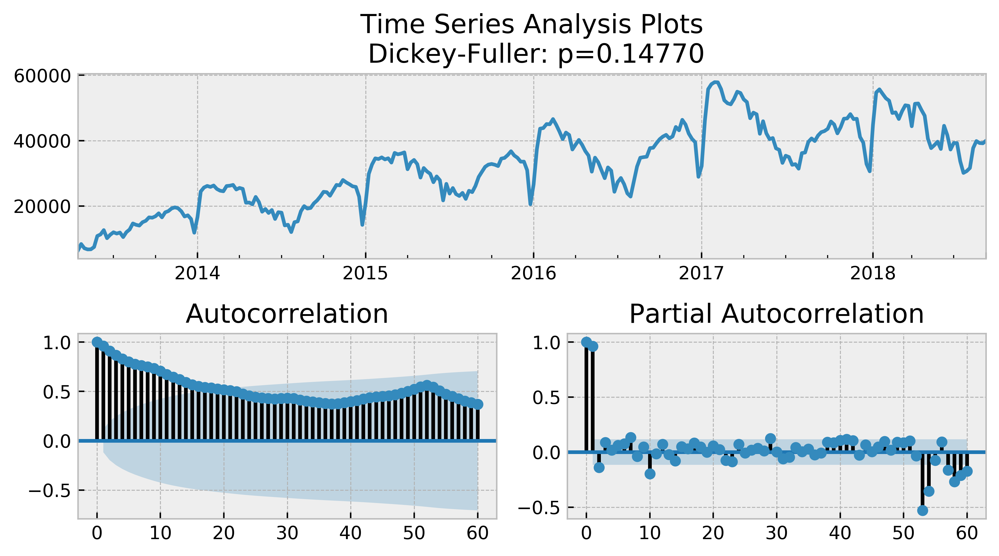

In [36]:
tsplot(adj_weekly_logins, lags=60)

We recall the definition of the augmented Dickey-Fuller test: Writing $\Delta X_t = X_t - X_{t-1}$, we can write the first difference of an AR(1) process as 

\begin{equation}
\Delta X_t = \mu + (\varphi - 1)X_t + Z_t,\,\, Z_t \sim \text{WN}(0,\sigma^2).
\end{equation}

Now we set $\delta := \varphi - 1$ and formulate the hypothesis as:

Reject $H_0$ at level $\alpha$: $\delta = 0$ vs. $H_1: \delta < 0$.

So our null hypothesis is a random walk with drift $\mu$, i.e. the first difference is not stationary around the mean $\mu$. Here, the Dickey-Fuller $p$-value is significantly greater than zero, we accept the null hypothesis, meaning that the series itself is not stationary, but the first difference might be.

From the partial autocorrelation plot, which gives information about the number of significant autoregressive lags, we see that not many other lags are significant beyond $h = 1$; it therefore looks like an AR(1) process is present with some seasonality $L$, which we identify as $L = 52$ from the number of significant lags between $h = 50$ and $h = 60$.

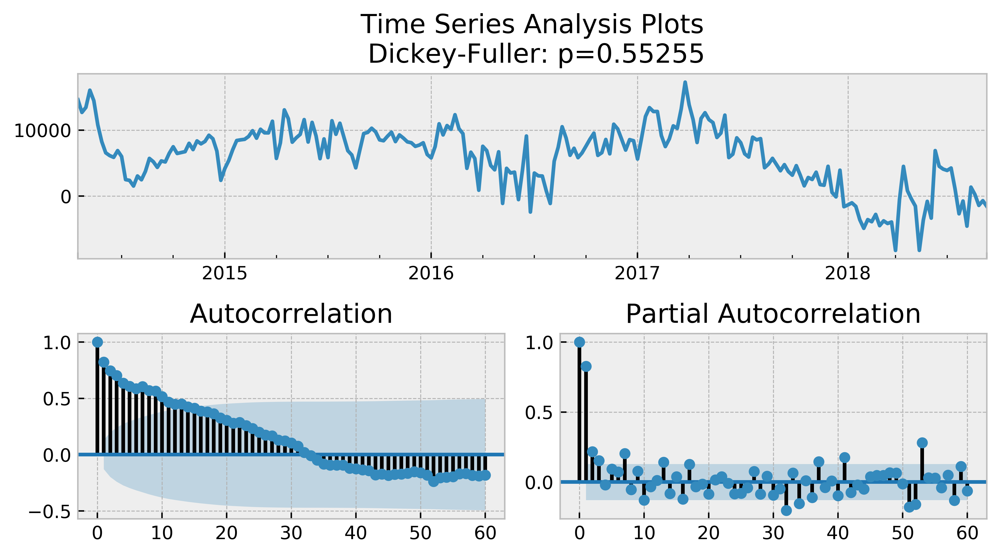

In [37]:
season = 52 #annual seasonality

weekly_diff = adj_weekly_logins - adj_weekly_logins.shift(season)
tsplot(weekly_diff[season:], lags=60)

This time, the visible significant autocorrelation due to seasonality effects is reduced. To make the series more stationary, we take first differences.

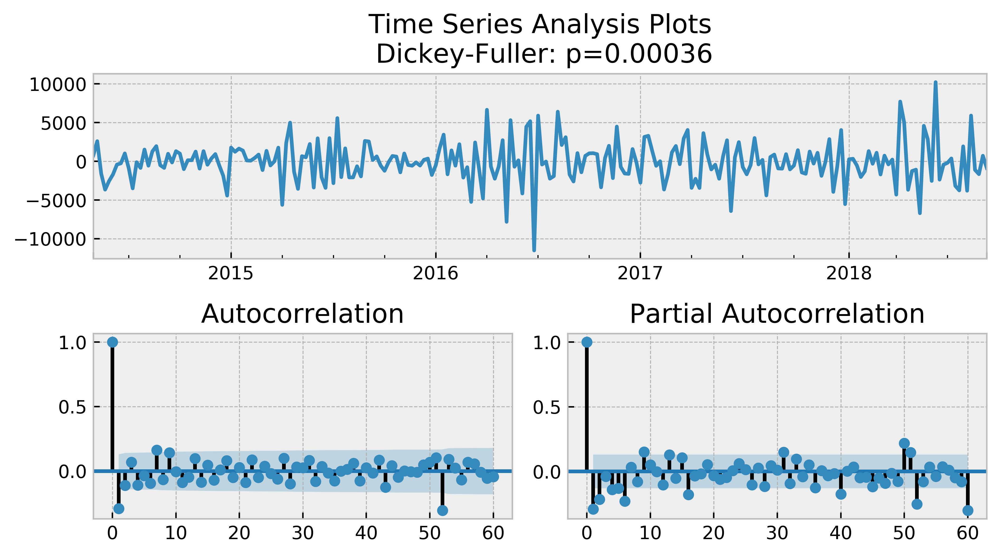

In [38]:
ar_order = 1 #autoregressive order
weekly_diff = weekly_diff - weekly_diff.shift(ar_order)

tsplot(weekly_diff[season+ar_order+1:], lags=60)

This time, based on the ADF test, we reject the null hypothesis of an AR(1) process. We can see that we end up with a series that is mostly stationary, oscillating around zero with an almost constant amplitude. Furthermore, we also reduced the number of significant lags in the autocorrelation function. 

Now after detrending and integrating the process, we can finally start modelling our time series as the result of a stochastic process!

# SARIMA Models

We introduce a family of stochastic models known as SARIMA(p,d,q,P,D,Q,s), which corresponds to Seasonal Autoregressive Integrated Moving Average Model. Its components are:

$AR(p)$: Autoregressive Model of order $p$. This means the time series evolves by regression onto its last $p$ values, i.e. its next value will be a linear combination of its previous $p$ values.

$MA(q)$: Moving Average Model of order $q$. In this model, the time series constitutes itself as a linear combination of the errors of previous stages, which are typically assumed as iid (written $Z_t \sim WN(0,\sigma^2)$).

$I(d)$: Order of integration. This is the nonseasonal shift that makes our series stationary.

$S(s)$: Order of seasonality. Seasonality shift that eliminates periodicity from our series. For behavioral data, this is often 24 (for hourly data), 7, 30, 365 (daily data), 52 (weekly data, also in this case).

The uppercase parameters are seasonal ARMA coefficients:

$P$: Autoregressive Order of the seasonal model. This can be derived from looking at the PACF, where it is given by the first lag in which the seasonality is not significant anymore.

$Q$: Moving Average Order of the seasonal model. This can be deducted from the ACF in the same fashion as $P$.

$D$: Seasonal Order of Integration. This can be 1 or 0, depending on whether seasonal differences were applied.

Judging from the ACF and PACF plots, we most probably have q = Q = 1, p = 2-6, P >= 2 and s = 52.

In [39]:
# setting initial values and some bounds for them
ps = range(0, 7)
d=1 
qs = range(0, 2)
Ps = range(0, 2)
D=1 
Qs = range(0, 2)
s = 52 # season length is fixed at 52 weeks = 1 year

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

56

In [40]:
def optimizeSARIMA(data, parameters_list, d, D, s, criterion="AIC"):
    """
        Return dataframe with parameters and corresponding Information Criterion
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """
    
    results = []
    best_ic_value = float("inf")

    for param in tqdm_notebook(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model=sm.tsa.statespace.SARIMAX(data, order=(param[0], d, param[1]), 
                                            seasonal_order=(param[2], D, param[3], s)).fit(disp=-1)
        except:
            continue
        
        ic_value = 0
        
        if criterion == "AIC":
            ic_value = model.aic
        elif criterion == "BIC":
            ic_value = model.bic
        elif criterion == "AICC":
            ic_value = model.aicc
        else:
            raise ValueError("Unknown Information Criterion selected")
        
        # saving best model, AIC and parameters
        if ic_value < best_ic_value:
            best_model = model
            best_ic_value = ic_value
            best_param = param
        results.append([param, ic_value])
    
    result_table = pd.DataFrame(results)
    result_table.columns = ['parameters', criterion]
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by=criterion, ascending=True).reset_index(drop=True)
    
    return result_table

We now start fitting the models consecutively. The selection criterion will be the AIC at first.

In [41]:
#%%time
result_table = optimizeSARIMA(adj_weekly_logins, parameters_list, d, D, s)

C:\Users\Nicholas\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\representation.py:375: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return matrix[[slice(None)]*(matrix.ndim-1) + [0]]


In [42]:
result_table.head()

,parameters,AIC
0,"(6, 1, 0, 1)",4207.790578
1,"(6, 1, 1, 0)",4207.870574
2,"(6, 1, 1, 1)",4209.221164
3,"(6, 0, 0, 1)",4214.475749
4,"(6, 0, 1, 0)",4214.810177


In [43]:
# set the parameters that give the lowest AIC
p, q, P, Q = result_table.parameters[0]

best_model=sm.tsa.statespace.SARIMAX(adj_weekly_logins, order=(p, d, q), 
                                        seasonal_order=(P, D, Q, s)).fit(disp=-1)
print(best_model.summary())

                                 Statespace Model Results                                 
Dep. Variable:                             RES_ID   No. Observations:                  282
Model:             SARIMAX(6, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -2094.895
Date:                            Tue, 26 Nov 2019   AIC                           4207.791
Time:                                    12:03:17   BIC                           4238.694
Sample:                                04-21-2013   HQIC                          4220.258
                                     - 09-09-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1775      0.073    -16.039      0.000      -1.321      -1.034
ar.L2         -0.4793      0.120   

We graphically inspect our model by examining the residuals together with their ACF and PACF.

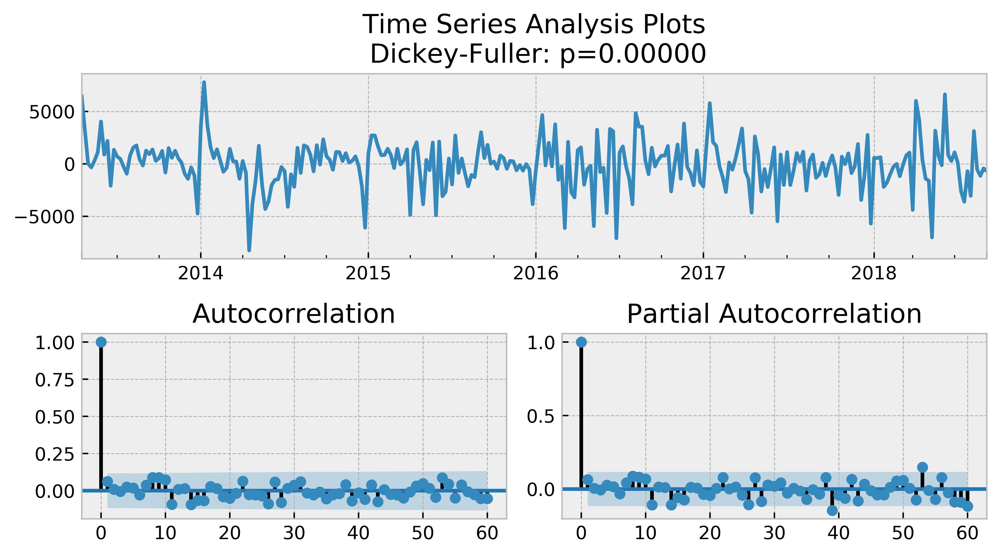

In [44]:
tsplot(best_model.resid, lags=60)

We now rerun the fitting process using the Bayes information criterion (BIC) for model selection, which places a special penalty on model complexity. 

In [45]:
bic_result_table = optimizeSARIMA(adj_weekly_logins, parameters_list, d, D, s, criterion="BIC")

C:\Users\Nicholas\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\representation.py:375: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return matrix[[slice(None)]*(matrix.ndim-1) + [0]]


In [46]:
bic_result_table.head()

,parameters,BIC
0,"(0, 1, 0, 1)",4226.246586
1,"(0, 1, 1, 0)",4227.750622
2,"(1, 1, 0, 1)",4230.040201
3,"(1, 1, 1, 0)",4230.333896
4,"(2, 0, 0, 1)",4231.750383


In [47]:
# set the parameters that give the lowest BIC
p2, q2, P2, Q2 = bic_result_table.parameters[0]

best_bic_model = sm.tsa.statespace.SARIMAX(adj_weekly_logins, order=(p2, d, q2), 
                                        seasonal_order=(P2, D, Q2, s)).fit(disp=-1)
print(best_bic_model.summary())

C:\Users\Nicholas\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\representation.py:375: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return matrix[[slice(None)]*(matrix.ndim-1) + [0]]


                                 Statespace Model Results                                 
Dep. Variable:                             RES_ID   No. Observations:                  282
Model:             SARIMAX(0, 1, 1)x(0, 1, 1, 52)   Log Likelihood               -2104.973
Date:                            Tue, 26 Nov 2019   AIC                           4215.945
Time:                                    12:19:43   BIC                           4226.247
Sample:                                04-21-2013   HQIC                          4220.101
                                     - 09-09-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3353      0.057     -5.885      0.000      -0.447      -0.224
ma.S.L52      -0.3680      0.058   

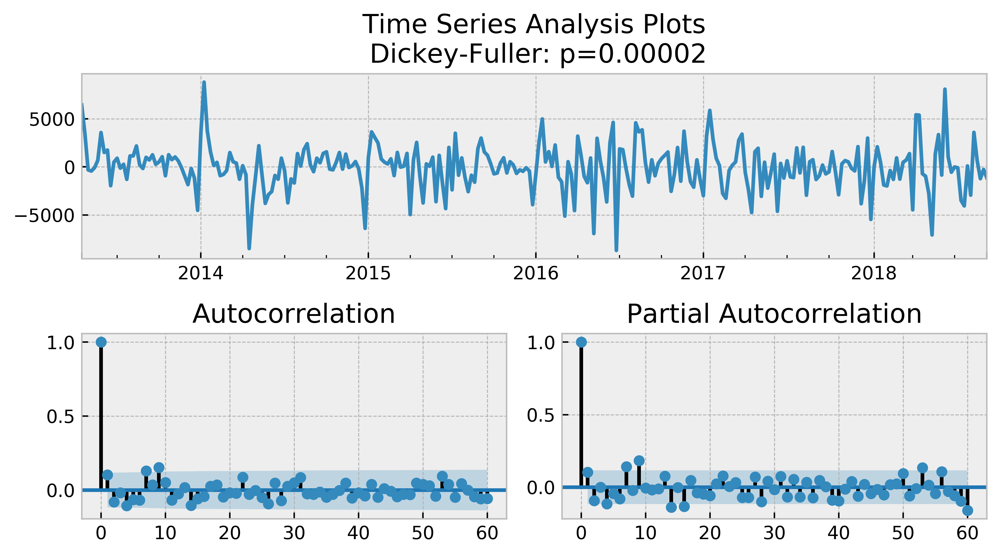

In [48]:
tsplot(best_bic_model.resid, lags=60)

Here we see that the double MA(1) model is the one with the lowest BIC, meaning that it gives already a good approximation with comparatively few parameters. 

We see that the residuals oscillate around zero with mostly insignificant ACF and PACF. Now we will predict using the two models.

In [50]:
def plotSARIMA(series, model, n_steps, dpi=500):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    arima_data = pd.Series(model.fittedvalues, index=series.index)
    #data.columns = ['actual']
    #data['arima_model'] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    arima_data[:s+d] = np.NaN
      
    # forecasting on n_steps forward 
    forecast = model.predict(start = arima_data.shape[0], end = arima_data.shape[0]+n_steps)
    forecast = arima_data.append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(series[s+d:], arima_data[s+d:])

    plt.figure(figsize=(3840/dpi, 2160/dpi), dpi=dpi)
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    plt.plot(forecast, color='r', label="model")
    plt.axvspan(arima_data.index[-1], forecast.index[-1], alpha=0.5, color='lightgrey')
    plt.plot(series, label="actual")
    plt.xlabel("Year")
    plt.ylabel("Number of logins")
    plt.legend()
    plt.grid(True);

C:\Users\Nicholas\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:320: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  freq=base_index.freq)


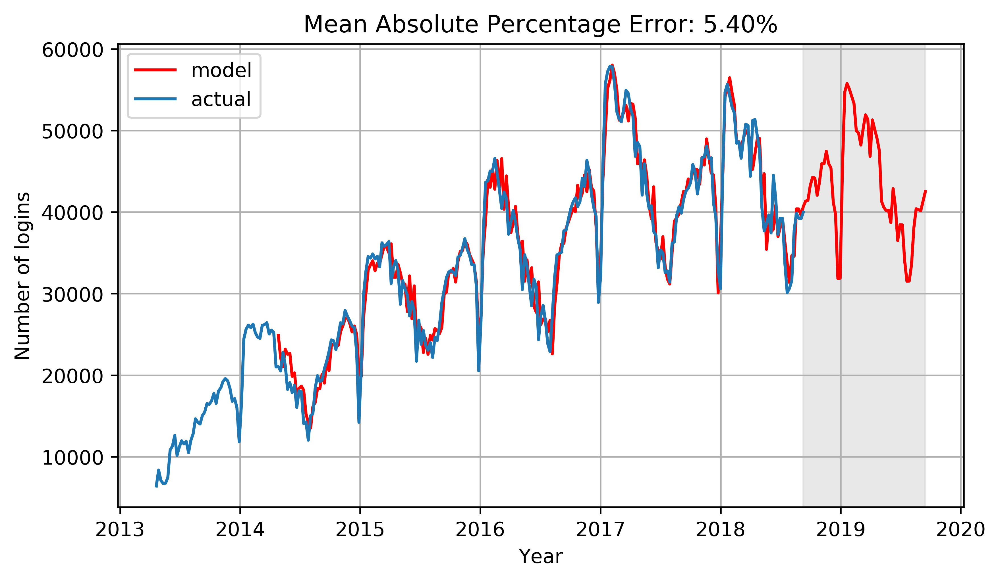

In [51]:
plotSARIMA(adj_weekly_logins, best_model, 52)

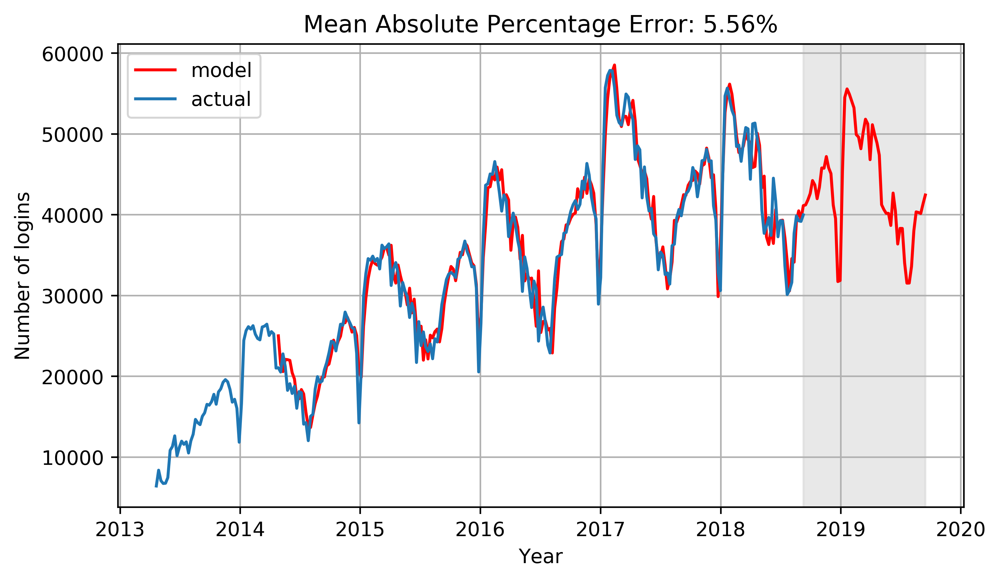

In [52]:
plotSARIMA(adj_weekly_logins, best_bic_model, 52)

As we can see from the one-year prediction, the best model, a SARIMAX(6, 1, 1)x(0, 1, 1, 52), seems to have identified both trend and general features of the data, i.e. turning points, peaks and valleys etc. 

We end up with about a 5-6% error in the training set, which is in the same ballpark as the smoothing methods discussed earlier. However, as we saw, training these SARIMA models takes considerably more time than the smoothing methods, which is important to know if time is a concern, such as for example in realtime algorithms. 

The best BIC MA(1) model does not perform considerably worse than the best AIC model, which has many more parameters. Hence, from a efficiency point of view, we would choose the MA(1) model over the AR(6) model, while for best accuracy we would prefer the AR(6) model, with possible overfitting involved that should be further investigated.

# Last choice: Gaussian Processes in scikit-learn

Lastly, we can model our stochastic process as a Gaussian process, which is characterized by the fact that every marginal distribution of our collection of random variables $(X_t)$ follows a multivariate Gaussian distribution $\mathcal{N}(\mu, \Sigma)$.

We will first detrend the series, then run the Gaussian Process regression on the differenced data.

In [53]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ExpSineSquared, RationalQuadratic

from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [54]:
adj_weekly_gp = adj_weekly_logins.copy(deep=True)

times = np.arange(len(adj_weekly_gp)).reshape(-1,1)

#Scaling as preprocessing
output_scaler = MinMaxScaler()

scaled_login_vals = output_scaler.fit_transform(adj_weekly_gp.values.reshape(-1,1)).flatten()

In [55]:
# Kernel with parameters
k1 = 1.0 * RBF()  # long term smooth rising trend
k2 = 1.0 * RBF(length_scale=0.2, length_scale_bounds=(1e-2,1e5)) * ExpSineSquared(length_scale=1.0, periodicity=52., periodicity_bounds="fixed") # seasonal component, assumed annual periodicity
k3 = 0.05**2 * RationalQuadratic(length_scale=0.04, alpha=0.02) # medium term irregularities
k4 = WhiteKernel(noise_level=0.1)  # noise terms 
kernel_gpml = k1 + k2 + k3 + k4

gp = GaussianProcessRegressor(kernel=kernel_gpml, alpha=0, n_restarts_optimizer=100)

gp.fit(times, scaled_login_vals)

print("\nLearned kernel: %s" % gp.kernel_)
print("Log-marginal-likelihood: %.3f"
      % gp.log_marginal_likelihood(gp.kernel_.theta))

C:\Users\Nicholas\Anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:480: ConvergenceWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([ 1.38876309e-04,  6.38580786e-05, -2.01737641e-04,  6.32271977e-04,
       -3.49927387e-11,  3.99222698e-05, -5.00742351e-06,  1.25909728e-04,
       -8.94594339e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 151, 'nit': 79, 'warnflag': 2}
  ConvergenceWarning)
C:\Users\Nicholas\Anaconda3\lib\site-packages\sklearn\gaussian_process\gpr.py:480: ConvergenceWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'grad': array([-8.93448946e-04, -0.00000000e+00, -3.57566999e-04,  6.53115854e-04,
        2.01773536e-23,  1.03459483e-04,  2.77924460e-04,  1.17672570e-03,
       -1.36535030e-05]), 'task': b'ABNORMAL_TERMINATION_IN_LNSRCH', 'funcalls': 67, 'nit': 21, 'warnflag': 2}
  ConvergenceWarning)



Learned kernel: 0.0516**2 * RBF(length_scale=11.9) + 0.0899**2 * RBF(length_scale=175) * ExpSineSquared(length_scale=0.194, periodicity=52) + 0.514**2 * RationalQuadratic(alpha=1e+05, length_scale=233) + WhiteKernel(noise_level=0.000758)
Log-marginal-likelihood: 474.218


We write a simple function for plotting the Gaussian process and its one year prediction with confidence intervals.

In [56]:
def plotGaussianProcess(series, process, scaler, n_steps=52, plot_std=False, dpi=500):
    """
        Plots Gaussian Process Regression vs. predicted values
        
        series - time series holding the cumulated login data
        process - fitted Gaussian Process model
        scaler - sklearn scaler used on the login data
        n_steps - number of steps to predict in the future
        plot_std - option to plot posterior confidence intervals
    """
    times = np.arange(len(series)).reshape(-1,1)
    
    #predict one year into the future
    pred_times = np.arange(len(adj_weekly_gp) + n_steps).reshape(-1,1)
    predicted_logins, pred_std = gp.predict(pred_times, return_std=True)
    
    future_weeks = pd.DatetimeIndex([series.index[0] + pd.Timedelta(weeks=int(i)) for i in pred_times])
    
    #reverse scaling
    predicted_logins = scaler.inverse_transform(predicted_logins.reshape(-1,1)).flatten()
    pred_std = scaler.inverse_transform(pred_std.reshape(-1,1)).flatten()
    
    # Error calculation
    gp_error = mean_absolute_percentage_error(series.values, predicted_logins[:len(series)])
    
    plt.figure(figsize=(3840/dpi, 2160/dpi), dpi=dpi)
    plt.plot(future_weeks, predicted_logins, label="Model")
    plt.plot(series.index, series.values, label="Actual")
    
    if plot_std:
        plt.plot(future_weeks, predicted_logins + pred_std, "r--", label="Upper Bound / Lower Bound")
        plt.plot(future_weeks, predicted_logins - pred_std, "r--", label="")
        plt.fill_between(x=future_weeks, y1=predicted_logins - pred_std, y2=predicted_logins + pred_std,
               alpha=0.2, color='grey')
        
    plt.xlabel("Year")
    plt.ylabel("Number of logins")
    plt.axvspan(series.index[-1], future_weeks[-1], alpha=0.5, color='lightgrey')
    #plt.axvspan(series.index[-1], pred_times[-1], alpha=0.5, color='lightgrey')
    plt.title("Number of visits over the years 2013-2018 \n Mean Absolute Percentage Error: {0:.2f}%".format(gp_error))
    plt.legend()
    plt.grid(True);

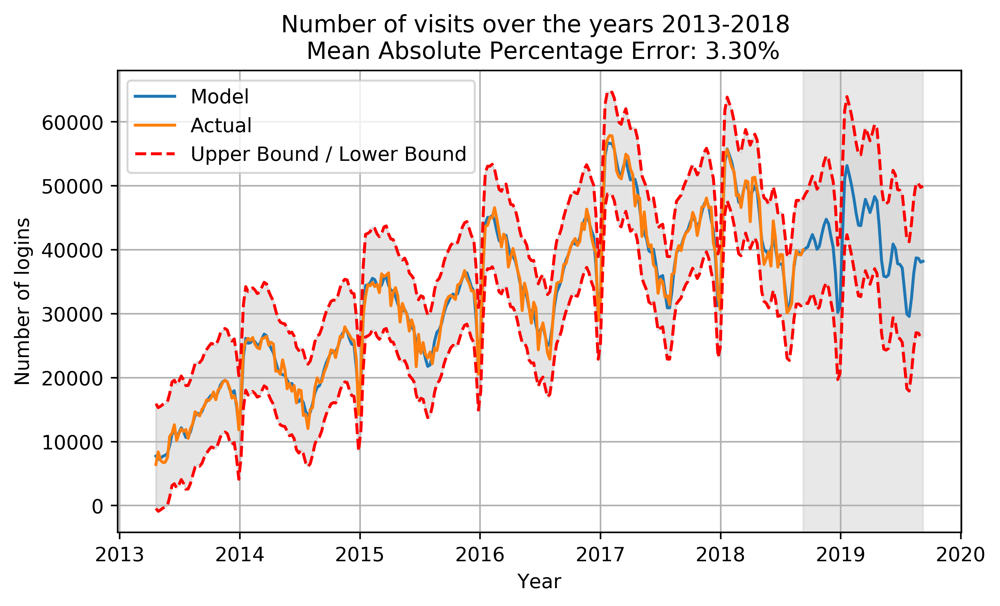

In [57]:
#predict one year into the future
plotGaussianProcess(adj_weekly_gp, gp, output_scaler, 52, plot_std=True)

Here, we see that although the learned process fits tighter to the data, the confidence intervals produced by the process are broader than for the smoothing and SARIMA approaches. We note a few advantages and disadvantages of Gaussian Processes:

\+ Runs comparatively fast for few datapoints like we have here 

\+ High flexibility with kernel functions

\+ High interpretability of the data due to the direct posterior modeling

\- Optimization does not guarantee a good fit, hyperparameter tuning is often necessary for good kernel estimates

\- Log-marginal likelihood is not convex, hence there can be multiple local optima

\- Fitting requires decomposition of an $N\times N$ covariance matrix, where $N$ is the number of data points. This grows at least as $\mathcal{O}(N^3)$ in $N$, meaning bad runtime behavior as $N$ gets larger


## Performing Cross Validation on the learned Gaussian Process

In [ ]:
from sklearn.model_selection import cross_val_score, train_test_split, TimeSeriesSplit

In [ ]:
# Perform a cross-validation estimate of the coefficient of determination using
# the cross_validation module using all CPUs available on the machine
output_scaler = preprocessing.MinMaxScaler()

times = mm_scaler.fit_transform(times)

login_vals = weekly_logins.values

login_vals = output_scaler.fit_transform(login_vals.reshape(-1,1)).flatten()

#train-test split
X_train, X_test, y_train, y_test = train_test_split(times, login_vals, test_size=0.2)

# Kernel with parameters given in GPML book
k1 = 1.0 * RBF(length_scale=3.0)  # long term smooth rising trend
k2 = 1.0 * RBF(length_scale=0.2) * ExpSineSquared(length_scale=1.0, periodicity=1.0) #, periodicity_bounds=(0.9,1.1))  # seasonal component, assumed annual periodicity
# medium term irregularities
k3 = 0.05**2 * RationalQuadratic(length_scale=0.04, alpha=0.02) #single kernel fit shows alpha ~ 0.02, i.e. weekly component
k4 = 1.0 * RBF(length_scale=0.01) + WhiteKernel(noise_level=0.001)  # noise terms 
kernel_gpml = k1 + k2 + k3 + k4

gp_cv = GaussianProcessRegressor(kernel=kernel_gpml, alpha=0, normalize_y=True, n_restarts_optimizer=10)

gp_cv.fit(X_train, y_train)

print("\nLearned kernel: %s" % gp_cv.kernel_)
print("Log-marginal-likelihood: %.3f"
      % gp_cv.log_marginal_likelihood(gp_cv.kernel_.theta))

In [ ]:
#predict one year into the future
weeks_pred = np.linspace(times.min(), times.max() + 0.2, 1000)[:, np.newaxis]
weekly_logins_pred, weekly_std = gp.predict(weeks_pred, return_std=True)
 
weekly_logins_pred = output_scaler.inverse_transform(weekly_logins_pred.reshape(-1,1)).flatten()
weekly_std = output_scaler.inverse_transform(weekly_std.reshape(-1,1)).flatten()
login_vals = output_scaler.inverse_transform(login_vals.reshape(-1,1)).flatten()

times = mm_scaler.inverse_transform(times)
weeks_pred = mm_scaler.inverse_transform(weeks_pred)

# Illustration
plt.scatter(times, login_vals, c='k')
plt.plot(weeks_pred, weekly_logins_pred)
plt.fill_between(weeks_pred[:, 0], weekly_logins_pred - weekly_std, weekly_logins_pred + weekly_std,
                 alpha=0.5, color='k')
plt.xlim(weeks_pred.min(), weeks_pred.max())
plt.xlabel("Year")
plt.ylabel(r"Number of visits")
plt.title(r"Number of visits over the years 2013-2018")
plt.tight_layout()
plt.show()

In [ ]:
scores = gp_cv.score(X_test, y_test)
scores